In [1]:
import os, pickle
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns; sns.set_theme()
import warnings
from tqdm import tqdm

In [ ]:
# build the grid

In [232]:
A = []
U = 0.8
tpp, tpd = 15.1549, 120.4221
grid_density = 10
# for tpp in np.linspace(5, 25, grid_density):
#     for tpd in np.linspace(100, 400, grid_density):
# for U in np.linspace(0.5, 0.8, 1grid_density5):
for Cp in np.linspace(0.02, 0.20, grid_density):
    for Cd in np.linspace(0.005, 0.05, grid_density):
        for taustf in np.linspace(50, 500, grid_density):
            for taustd in np.linspace(50, 500, grid_density):
                A.append({'U':U, 'Cp':Cp, 'Cd':Cd, 'tpp':tpp, 'tpd':tpd, 'taustf':taustf, 'taustd':taustd})

In [233]:
A.insert(0, {'U':0.7708, 
             'Cp':0.1062, 
             'Cd':0.0110, 
             'tpp':15.1549, 
             'tpd':120.4221,
             'taustf':235.0004,
             'taustd':100.0000})
pd.DataFrame(A).to_pickle('df.pkl')
gr = pd.read_pickle('df.pkl')

gr

,U,Cp,Cd,tpp,tpd,taustf,taustd
0,0.7708,0.1062,0.011,15.1549,120.4221,235.0004,100.0
1,0.8000,0.0200,0.005,15.1549,120.4221,50.0000,50.0
2,0.8000,0.0200,0.005,15.1549,120.4221,50.0000,100.0
3,0.8000,0.0200,0.005,15.1549,120.4221,50.0000,150.0
4,0.8000,0.0200,0.005,15.1549,120.4221,50.0000,200.0
...,...,...,...,...,...,...,...
9996,0.8000,0.2000,0.050,15.1549,120.4221,500.0000,300.0
9997,0.8000,0.2000,0.050,15.1549,120.4221,500.0000,350.0
9998,0.8000,0.2000,0.050,15.1549,120.4221,500.0000,400.0
9999,0.8000,0.2000,0.050,15.1549,120.4221,500.0000,450.0


In [532]:
with open('mod.txt', 'r') as f:
    lines = f.readlines()

In [533]:
c = 0
for line in lines:
    if len(line.split(', ')) > 8:
        c += 1
c

2696

In [223]:
# ! rm -r slurm
# ! mkdir slurm

In [534]:
len(os.listdir('./slurm'))

10003

In [535]:
warnings.filterwarnings('ignore')
df = pd.read_csv('mod.txt', header=None, error_bad_lines=False)
df.columns = ['JOB_ID', 'TASK_ID', 'cell_id', 't', 'mod', 'n_clust', 'min_clust', 'max_clust']
for j, i in tqdm(enumerate(gr.columns)):
    df[i] = df.dropna().cell_id.apply(lambda x: gr.loc[int(x), i])
df['Cp'] = df.apply(lambda x: np.round(x.Cp, 3), axis=1)
df['Cd'] = df.apply(lambda x: np.round(x.Cd, 3), axis=1)
df

b'Skipping line 27957: expected 8 fields, saw 15\nSkipping line 52087: expected 8 fields, saw 15\nSkipping line 52665: expected 8 fields, saw 15\nSkipping line 54172: expected 8 fields, saw 15\nSkipping line 63327: expected 8 fields, saw 15\nSkipping line 64565: expected 8 fields, saw 15\nSkipping line 65020: expected 8 fields, saw 15\n'
b'Skipping line 78477: expected 8 fields, saw 15\nSkipping line 90576: expected 8 fields, saw 15\nSkipping line 95640: expected 8 fields, saw 15\nSkipping line 99076: expected 8 fields, saw 15\nSkipping line 99609: expected 8 fields, saw 15\nSkipping line 103747: expected 8 fields, saw 15\nSkipping line 104564: expected 8 fields, saw 15\nSkipping line 109257: expected 8 fields, saw 15\nSkipping line 109316: expected 8 fields, saw 15\nSkipping line 109326: expected 8 fields, saw 15\nSkipping line 111666: expected 8 fields, saw 15\nSkipping line 112953: expected 8 fields, saw 15\nSkipping line 113538: expected 8 fields, saw 15\nSkipping line 120408: expe

b'Skipping line 594430: expected 8 fields, saw 15\nSkipping line 595450: expected 8 fields, saw 9\nSkipping line 597674: expected 8 fields, saw 15\nSkipping line 598844: expected 8 fields, saw 15\nSkipping line 599595: expected 8 fields, saw 15\nSkipping line 600372: expected 8 fields, saw 15\nSkipping line 600985: expected 8 fields, saw 15\nSkipping line 601224: expected 8 fields, saw 15\nSkipping line 601828: expected 8 fields, saw 15\nSkipping line 603369: expected 8 fields, saw 15\nSkipping line 606362: expected 8 fields, saw 15\nSkipping line 610625: expected 8 fields, saw 15\nSkipping line 612844: expected 8 fields, saw 15\nSkipping line 613457: expected 8 fields, saw 15\nSkipping line 614552: expected 8 fields, saw 15\nSkipping line 615150: expected 8 fields, saw 15\nSkipping line 615932: expected 8 fields, saw 15\nSkipping line 615977: expected 8 fields, saw 15\nSkipping line 616401: expected 8 fields, saw 22\nSkipping line 616403: expected 8 fields, saw 15\nSkipping line 62364

b'Skipping line 1193098: expected 8 fields, saw 15\nSkipping line 1195259: expected 8 fields, saw 15\nSkipping line 1197084: expected 8 fields, saw 15\nSkipping line 1197375: expected 8 fields, saw 15\nSkipping line 1198213: expected 8 fields, saw 15\nSkipping line 1198284: expected 8 fields, saw 15\nSkipping line 1199102: expected 8 fields, saw 15\nSkipping line 1199605: expected 8 fields, saw 15\nSkipping line 1199961: expected 8 fields, saw 15\nSkipping line 1200138: expected 8 fields, saw 15\nSkipping line 1201590: expected 8 fields, saw 15\nSkipping line 1202724: expected 8 fields, saw 15\nSkipping line 1202955: expected 8 fields, saw 15\nSkipping line 1204109: expected 8 fields, saw 15\nSkipping line 1204438: expected 8 fields, saw 15\nSkipping line 1204508: expected 8 fields, saw 15\nSkipping line 1204522: expected 8 fields, saw 15\nSkipping line 1204569: expected 8 fields, saw 15\nSkipping line 1204586: expected 8 fields, saw 15\nSkipping line 1205449: expected 8 fields, saw 15

b'Skipping line 1786746: expected 8 fields, saw 15\nSkipping line 1787171: expected 8 fields, saw 15\nSkipping line 1788013: expected 8 fields, saw 15\nSkipping line 1789299: expected 8 fields, saw 15\nSkipping line 1789326: expected 8 fields, saw 15\nSkipping line 1789655: expected 8 fields, saw 15\nSkipping line 1791414: expected 8 fields, saw 15\nSkipping line 1792547: expected 8 fields, saw 15\nSkipping line 1792723: expected 8 fields, saw 15\nSkipping line 1792873: expected 8 fields, saw 15\nSkipping line 1793270: expected 8 fields, saw 15\nSkipping line 1793415: expected 8 fields, saw 15\nSkipping line 1794780: expected 8 fields, saw 15\nSkipping line 1795029: expected 8 fields, saw 15\nSkipping line 1796486: expected 8 fields, saw 15\nSkipping line 1796489: expected 8 fields, saw 15\nSkipping line 1796504: expected 8 fields, saw 15\nSkipping line 1796544: expected 8 fields, saw 15\nSkipping line 1796597: expected 8 fields, saw 15\nSkipping line 1797774: expected 8 fields, saw 15

b'Skipping line 2384080: expected 8 fields, saw 15\nSkipping line 2385148: expected 8 fields, saw 15\nSkipping line 2386122: expected 8 fields, saw 15\nSkipping line 2389074: expected 8 fields, saw 15\nSkipping line 2389078: expected 8 fields, saw 15\nSkipping line 2389668: expected 8 fields, saw 15\nSkipping line 2391573: expected 8 fields, saw 15\nSkipping line 2392757: expected 8 fields, saw 15\nSkipping line 2393205: expected 8 fields, saw 15\nSkipping line 2394015: expected 8 fields, saw 22\nSkipping line 2394029: expected 8 fields, saw 15\nSkipping line 2394082: expected 8 fields, saw 15\nSkipping line 2394085: expected 8 fields, saw 15\nSkipping line 2396970: expected 8 fields, saw 15\nSkipping line 2397486: expected 8 fields, saw 15\nSkipping line 2397525: expected 8 fields, saw 15\nSkipping line 2398198: expected 8 fields, saw 15\nSkipping line 2399984: expected 8 fields, saw 15\nSkipping line 2400595: expected 8 fields, saw 15\nSkipping line 2401349: expected 8 fields, saw 22

7it [01:58, 16.89s/it]


,JOB_ID,TASK_ID,cell_id,t,mod,n_clust,min_clust,max_clust,U,Cp,Cd,tpp,tpd,taustf,taustd
0,10436763.0,1.0,0.0,0.0,0.021396,10.0,45.0,380.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0
1,10436764.0,1.0,1.0,0.0,0.019707,14.0,59.0,310.0,0.8000,0.020,0.005,15.1549,120.4221,50.0000,50.0
2,10436767.0,1.0,4.0,0.0,0.021981,9.0,62.0,454.0,0.8000,0.020,0.005,15.1549,120.4221,50.0000,200.0
3,10436766.0,1.0,3.0,0.0,0.021120,10.0,123.0,395.0,0.8000,0.020,0.005,15.1549,120.4221,50.0000,150.0
4,10436765.0,1.0,2.0,0.0,0.020120,13.0,1.0,347.0,0.8000,0.020,0.005,15.1549,120.4221,50.0000,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2679342,10457883.0,1.0,9977.0,1345000.0,0.039140,13.0,62.0,472.0,0.8000,0.200,0.050,15.1549,120.4221,400.0000,350.0
2679343,10457883.0,1.0,9977.0,1350000.0,0.039359,14.0,18.0,378.0,0.8000,0.200,0.050,15.1549,120.4221,400.0000,350.0
2679344,10457883.0,1.0,9977.0,1355000.0,0.039752,41.0,1.0,408.0,0.8000,0.200,0.050,15.1549,120.4221,400.0000,350.0
2679345,10457883.0,1.0,9977.0,1360000.0,0.040220,39.0,1.0,343.0,0.8000,0.200,0.050,15.1549,120.4221,400.0000,350.0


5it [00:00, 45.66it/s]

N leaders: 1191


1191it [00:33, 35.94it/s]


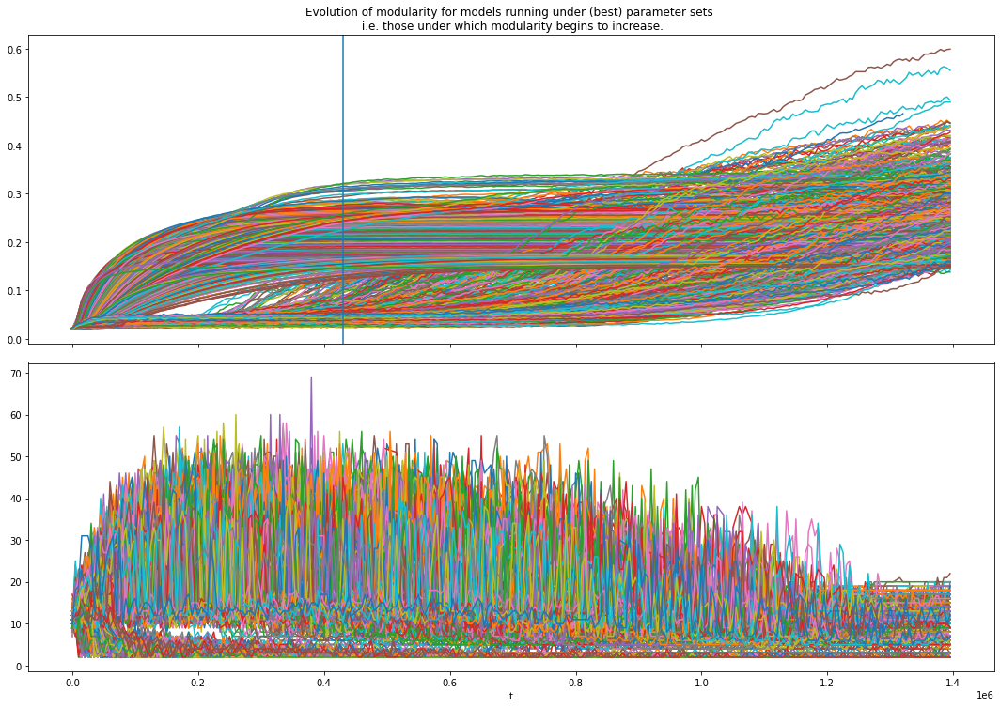

In [538]:
%matplotlib inline
leaders = df[df['mod'] >= 0.15].cell_id.unique().tolist()
print(f'N leaders: {len(leaders)}')

fig, ax = plt.subplots(2,1, figsize=(15,10), sharex=True)
plt.tight_layout()

for j, i in tqdm(enumerate(leaders)):
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='mod', label=i, ax=ax[0], legend=None)
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='n_clust', label=i, ax=ax[1], legend=None)
ax[0].set_title('Evolution of modularity for models running under (best) parameter sets \n i.e. those under which modularity begins to increase.')
ax[0].axvline(430000)

1191it [00:06, 170.78it/s]
5it [00:00, 43.81it/s]

N stabilized leaders: 802


802it [00:19, 40.12it/s]


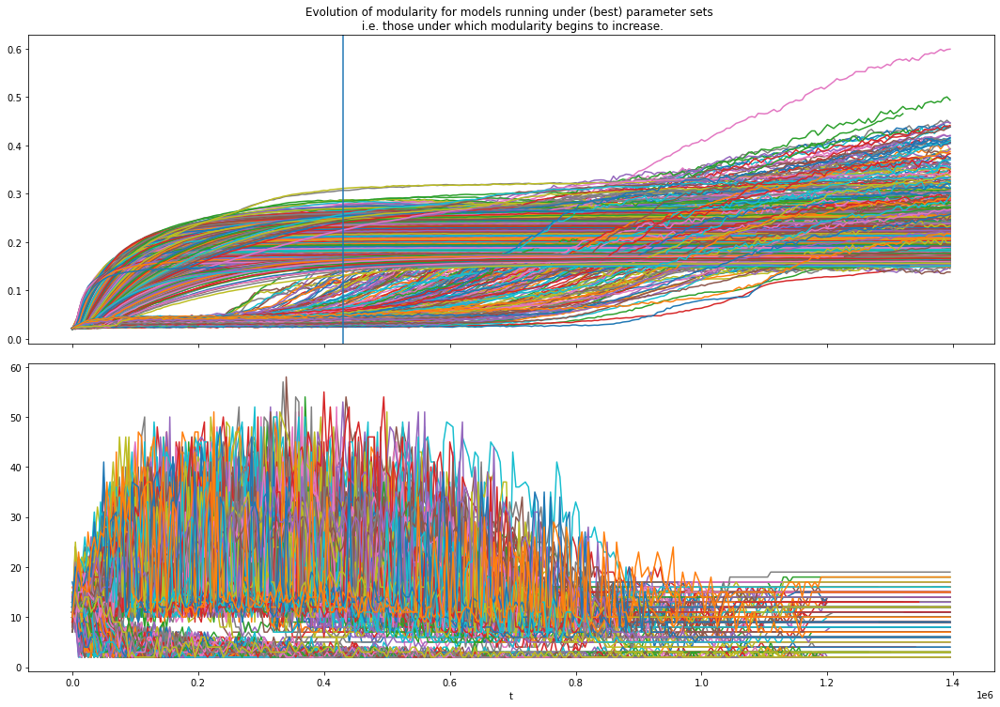

In [668]:
A = []


leaders = df[df['mod'] >= 0.15].cell_id.unique().tolist()
for j, i in tqdm(enumerate(leaders)):
    var = df[(df.cell_id == i)  & (df.t >= 1200000)].sort_values(by='t').n_clust.var()
    A.append((i, var))
A.sort(key=lambda tup: tup[1])
stabilized_leaders = [int(i[0]) for i in A if i[1] == 0]

leaders = df[df['mod'] >= 0.15].cell_id.unique().tolist()
print(f'N stabilized leaders: {len(stabilized_leaders)}')

fig, ax = plt.subplots(2,1, figsize=(15,10), sharex=True)
plt.tight_layout()

for j, i in tqdm(enumerate(stabilized_leaders)):
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='mod', label=i, ax=ax[0], legend=None)
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='n_clust', label=i, ax=ax[1], legend=None)
ax[0].set_title('Evolution of modularity for models running under (best) parameter sets \n i.e. those under which modularity begins to increase.')
ax[0].axvline(430000)

3it [00:00, 42.17it/s]


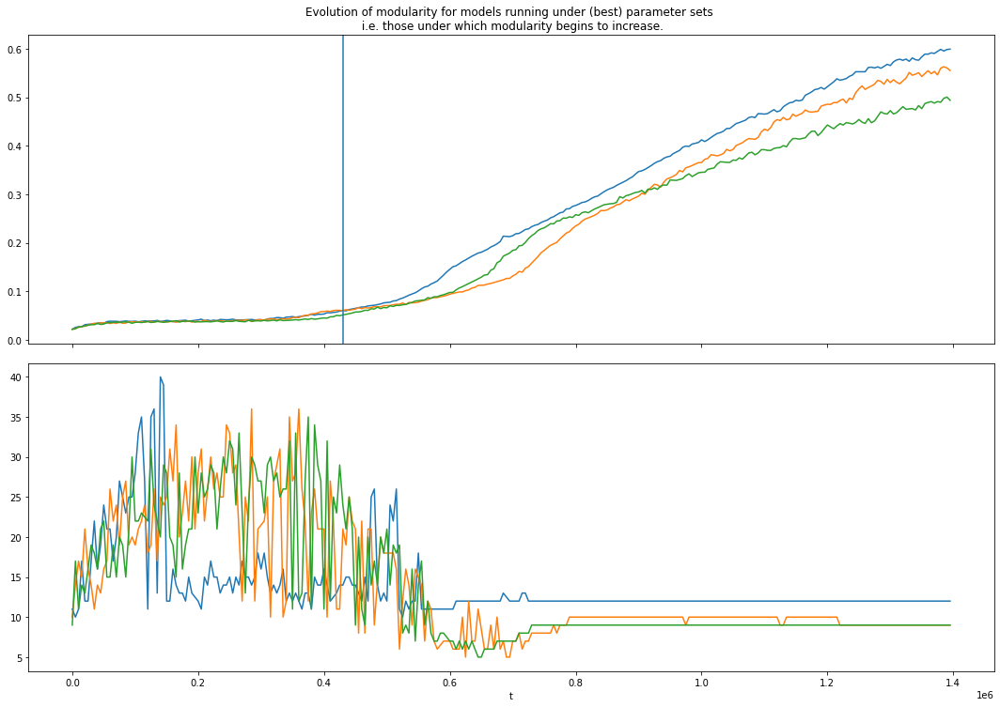

In [666]:
super_leaders = df[df['mod'] >= 0.5].cell_id.unique().tolist()

fig, ax = plt.subplots(2,1, figsize=(15,10), sharex=True)
plt.tight_layout()

for j, i in tqdm(enumerate(super_leaders)):
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='mod', label=i, ax=ax[0], legend=None)
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='n_clust', label=i, ax=ax[1], legend=None)
ax[0].set_title('Evolution of modularity for models running under (best) parameter sets \n i.e. those under which modularity begins to increase.')
ax[0].axvline(430000)

In [ ]:
# despite continued modularity growth, the number of assemblies remains stable

5it [00:00, 46.10it/s]

early_birds: 1109, late_birds: 508


1109it [00:29, 37.71it/s]
508it [00:18, 27.68it/s]


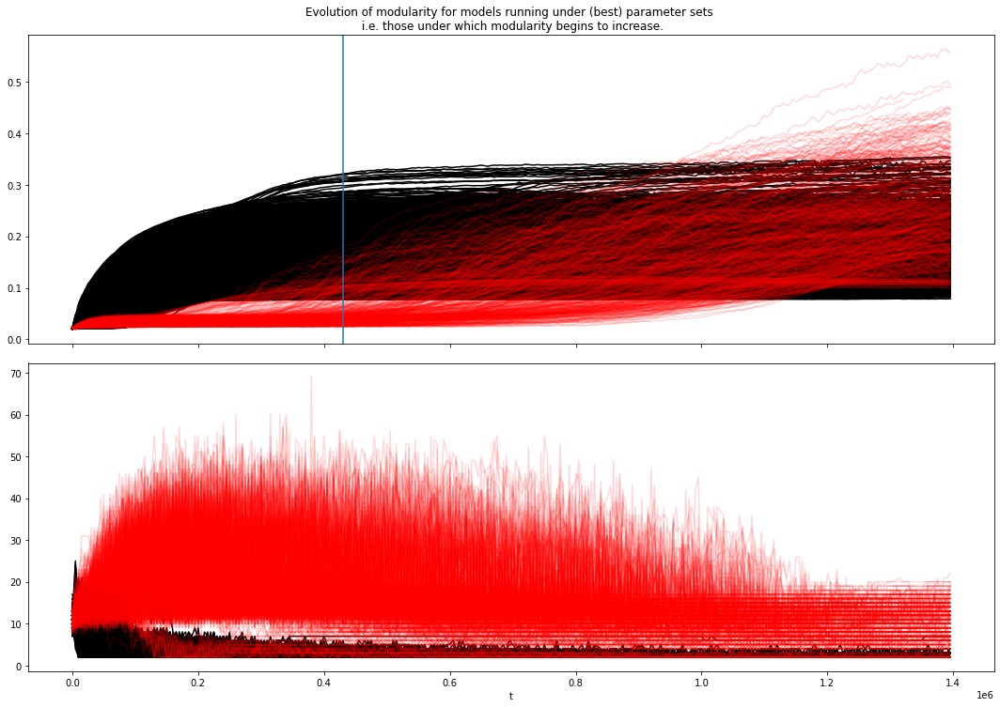

In [648]:
early_birds_ids = df[(df.t == 220000) & (df['mod'] > 0.075)].cell_id.to_list()
late_birds_ids_a = set(df[(df.t == 220000) & (df['mod'] <= 0.075)].cell_id.to_list())
late_birds_ids_b = set(df[(df.t == 1200000) & (df['mod'] > 0.1)].cell_id.to_list())
late_birds_ids = list(late_birds_ids_a.intersection(late_birds_ids_b))

early_birds = df[df.cell_id.isin(early_birds_ids)]
late_birds = df[df.cell_id.isin(late_birds_ids)]
print(f'early_birds: {len(early_birds_ids)}, late_birds: {len(late_birds_ids)}')


fig, ax = plt.subplots(2,1, figsize=(15,10), sharex=True)
plt.tight_layout()
for j, i in tqdm(enumerate(early_birds_ids)):
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='mod', label=i, color='black', ax=ax[0], legend=None)
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='n_clust', label=i, color='black', ax=ax[1], legend=None)
for j, i in tqdm(enumerate(late_birds_ids)):
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='mod', label=i, color='red', alpha=0.15, ax=ax[0], legend=None)
    df[df.cell_id == i].sort_values(by='t').plot(x='t', y='n_clust', label=i, color='red', alpha=0.15, ax=ax[1], legend=None)
ax[0].set_title('Evolution of modularity for models running under (best) parameter sets \n i.e. those under which modularity begins to increase.')
ax[0].axvline(430000)

<AxesSubplot:xlabel='t', ylabel='n_clust'>

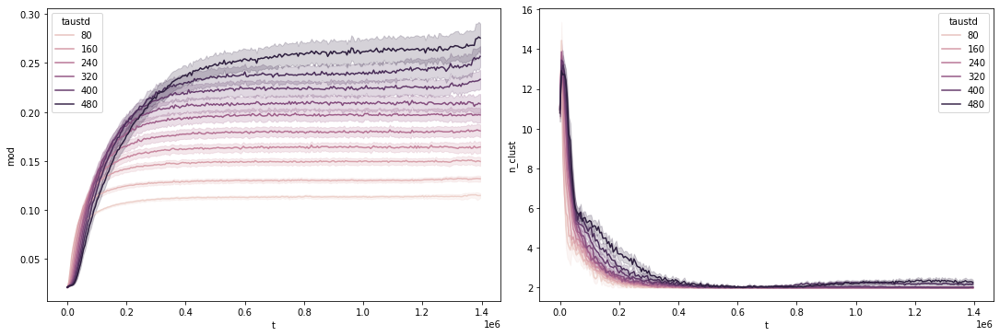

In [632]:
# select the ones whose modularity rises fast but then plateaus:

fig, ax = plt.subplots(1,2, figsize=(15,5), sharex=True)
plt.tight_layout()
        
sns.lineplot(data=early_birds, x='t', y='mod', hue='taustd', ax=ax[0])
sns.lineplot(data=early_birds, x='t', y='n_clust', hue='taustd', ax=ax[1])

<AxesSubplot:xlabel='t', ylabel='n_clust'>

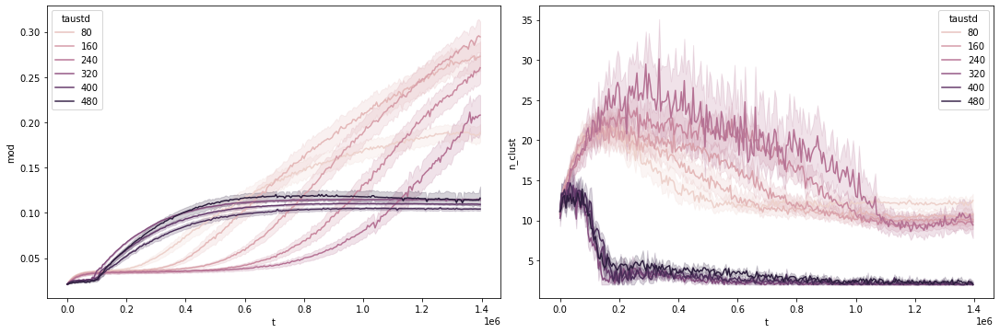

In [644]:
fig, ax = plt.subplots(1,2, figsize=(15,5), sharex=True)
plt.tight_layout()

sns.lineplot(data=late_birds, x='t', y='mod', hue='taustd', ax=ax[0])
sns.lineplot(data=late_birds, x='t', y='n_clust', hue='taustd', ax=ax[1])

In [539]:
tmp = df[df.cell_id.isin(leaders)].sort_values(by=['cell_id', 't'])
tmp

,JOB_ID,TASK_ID,cell_id,t,mod,n_clust,min_clust,max_clust,U,Cp,Cd,tpp,tpd,taustf,taustd
0,10436763.0,1.0,0.0,0.0,0.021396,10.0,45.0,380.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0
7,10436763.0,1.0,0.0,5000.0,0.022283,11.0,10.0,442.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0
19,10436763.0,1.0,0.0,10000.0,0.022960,10.0,3.0,478.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0
39,10436763.0,1.0,0.0,15000.0,0.022783,13.0,9.0,435.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0
63,10436763.0,1.0,0.0,20000.0,0.023645,10.0,67.0,441.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2678562,10457759.0,1.0,9893.0,1375000.0,0.262720,8.0,91.0,1632.0,0.8000,0.200,0.045,15.1549,120.4221,500.0000,150.0
2678623,10457759.0,1.0,9893.0,1380000.0,0.269566,8.0,92.0,1631.0,0.8000,0.200,0.045,15.1549,120.4221,500.0000,150.0
2678685,10457759.0,1.0,9893.0,1385000.0,0.273521,8.0,93.0,1629.0,0.8000,0.200,0.045,15.1549,120.4221,500.0000,150.0
2678744,10457759.0,1.0,9893.0,1390000.0,0.270425,8.0,93.0,1626.0,0.8000,0.200,0.045,15.1549,120.4221,500.0000,150.0


<AxesSubplot:xlabel='t', ylabel='n_clust'>

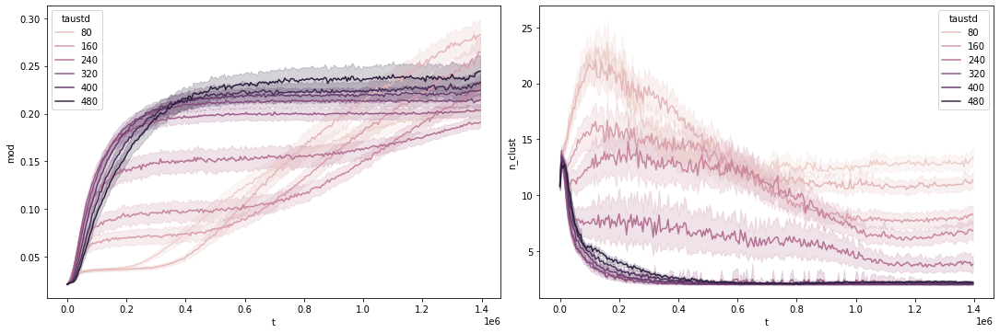

In [540]:
fig, ax = plt.subplots(1,2, figsize=(15,5), sharex=True)
plt.tight_layout()

sns.lineplot(data=tmp, x='t', y='mod', hue='taustd', ax=ax[0])
sns.lineplot(data=tmp, x='t', y='n_clust', hue='taustd', ax=ax[1])

<AxesSubplot:xlabel='t', ylabel='n_clust'>

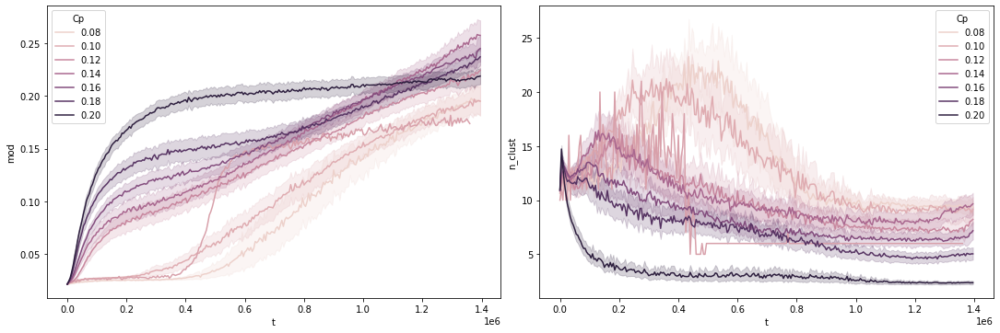

In [541]:
fig, ax = plt.subplots(1,2, figsize=(15,5), sharex=True)
plt.tight_layout()

sns.lineplot(data=tmp, x='t', y='mod', hue='Cp', ax=ax[0])
sns.lineplot(data=tmp, x='t', y='n_clust', hue='Cp', ax=ax[1])

In [542]:
max_t = []
for cellid in tmp.cell_id.unique():
    max_t.append((cellid, tmp[tmp.cell_id == cellid].t.max()))
grid = pd.DataFrame()
for i, tup in enumerate(max_t):
    grid = grid.append(tmp[(tmp.cell_id == tup[0]) & (tmp.t == tup[1])])
grid.reset_index(inplace=True, drop=True)
grid['cell_id'] = grid.cell_id.apply(int)
grid['dif'] = grid.apply(lambda x: np.abs(x.min_clust - x.max_clust), axis=1)
grid['Cp'] = grid.apply(lambda x: np.round(x.Cp, 3), axis=1)
grid['Cd'] = grid.apply(lambda x: np.round(x.Cd, 3), axis=1)

grid

,JOB_ID,TASK_ID,cell_id,t,mod,n_clust,min_clust,max_clust,U,Cp,Cd,tpp,tpd,taustf,taustd,dif
0,10436763.0,1.0,0,1360000.0,0.173770,6.0,338.0,487.0,0.7708,0.106,0.011,15.1549,120.4221,235.0004,100.0,149.0
1,10442064.0,1.0,3102,1395000.0,0.165809,9.0,217.0,315.0,0.8000,0.080,0.010,15.1549,120.4221,50.0000,100.0,98.0
2,10442074.0,1.0,3112,1395000.0,0.170231,10.0,189.0,304.0,0.8000,0.080,0.010,15.1549,120.4221,100.0000,100.0,115.0
3,10442085.0,1.0,3122,1395000.0,0.185210,11.0,203.0,257.0,0.8000,0.080,0.010,15.1549,120.4221,150.0000,100.0,54.0
4,10442095.0,1.0,3132,1395000.0,0.176387,8.0,213.0,479.0,0.8000,0.080,0.010,15.1549,120.4221,200.0000,100.0,266.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1186,10457611.0,1.0,9783,1395000.0,0.257279,6.0,139.0,1746.0,0.8000,0.200,0.040,15.1549,120.4221,450.0000,150.0,1607.0
1187,10457626.0,1.0,9793,1395000.0,0.295600,6.0,133.0,1695.0,0.8000,0.200,0.040,15.1549,120.4221,500.0000,150.0,1562.0
1188,10457745.0,1.0,9883,1395000.0,0.184354,7.0,89.0,1817.0,0.8000,0.200,0.045,15.1549,120.4221,450.0000,150.0,1728.0
1189,10457756.0,1.0,9892,1395000.0,0.160522,7.0,4.0,1856.0,0.8000,0.200,0.045,15.1549,120.4221,500.0000,100.0,1852.0


In [606]:
# dat = grid[(grid['mod']>0.30)].sort_values(by='mod').rename_axis('old_id').reset_index()
dat = grid[grid.cell_id.isin(stabilized_leaders)].sort_values(by='mod').rename_axis('old_id').reset_index()
dat


,old_id,JOB_ID,TASK_ID,cell_id,t,mod,n_clust,min_clust,max_clust,U,Cp,Cd,tpp,tpd,taustf,taustd,dif
0,32,10445797.0,1.0,4161,1395000.0,0.137903,8.0,151.0,488.0,0.8,0.10,0.010,15.1549,120.4221,350.0,50.0,337.0
1,29,10445664.0,1.0,4151,1310000.0,0.142238,7.0,254.0,475.0,0.8,0.10,0.010,15.1549,120.4221,300.0,50.0,221.0
2,25,10445517.0,1.0,4141,1395000.0,0.145040,8.0,226.0,442.0,0.8,0.10,0.010,15.1549,120.4221,250.0,50.0,216.0
3,296,10450425.0,1.0,6176,1245000.0,0.146671,2.0,626.0,1874.0,0.8,0.14,0.010,15.1549,120.4221,400.0,300.0,1248.0
4,299,10450437.0,1.0,6186,1395000.0,0.147714,2.0,630.0,1870.0,0.8,0.14,0.010,15.1549,120.4221,450.0,300.0,1240.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
797,338,10451228.0,1.0,6383,1395000.0,0.446285,8.0,197.0,412.0,0.8,0.14,0.020,15.1549,120.4221,450.0,150.0,215.0
798,637,10453724.0,1.0,7553,1395000.0,0.446810,14.0,151.0,245.0,0.8,0.16,0.030,15.1549,120.4221,300.0,150.0,94.0
799,642,10453739.0,1.0,7563,1320000.0,0.465605,14.0,139.0,219.0,0.8,0.16,0.030,15.1549,120.4221,350.0,150.0,80.0
800,599,10453462.0,1.0,7473,1395000.0,0.493797,9.0,180.0,371.0,0.8,0.16,0.025,15.1549,120.4221,400.0,150.0,191.0


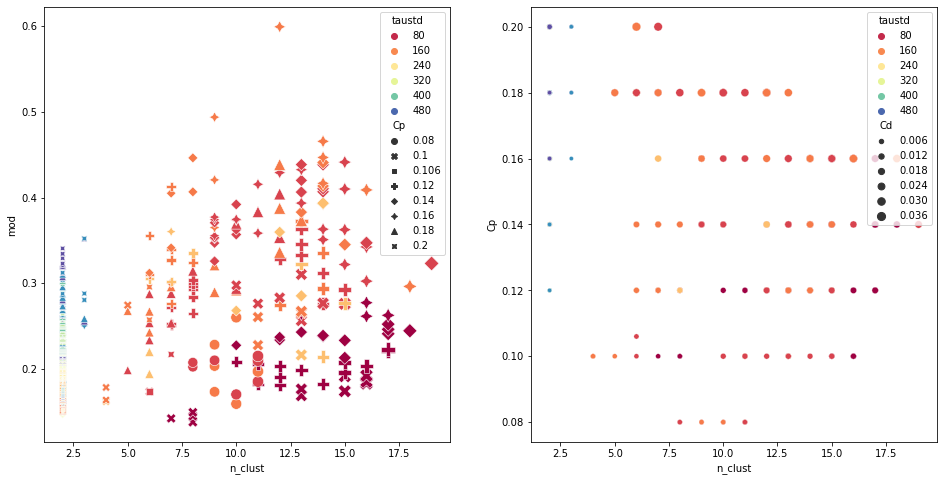

In [620]:
%matplotlib inline

# n_clust = 4



# dat = grid[(grid['mod']>0.20)].sort_values(by='mod').rename_axis('old_id').reset_index()
size = dat.n_clust.apply(lambda x: (x+10)**1.6)
# size = dat.Cp.apply(lambda x: (x+10)**1.6)



fig, ax = plt.subplots(1,2, figsize=(16, 8))
_ = sns.scatterplot(data=dat,
                    x='n_clust',
                    y='mod', 
                    hue='taustd',
                    style='Cp',
                    s=size,
                    palette='Spectral',
                    ax=ax[0])

_ = sns.scatterplot(data=dat,
                    x='n_clust',
                    y='Cp', 
                    hue='taustd',
                    size='Cd',
                    palette='Spectral',
                    ax=ax[1])

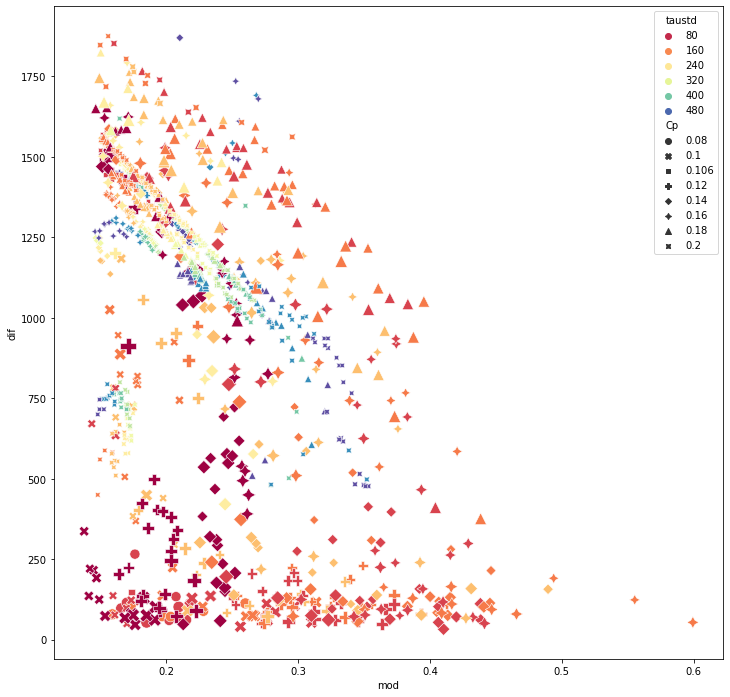

In [571]:
%matplotlib inline

# n_clust = 4



# dat = grid[(grid['mod']>0.02)].sort_values(by='mod').rename_axis('old_id').reset_index()
dat = grid
size = dat.n_clust.apply(lambda x: (x+10)**1.6)


fig, ax = plt.subplots(1,1, figsize=(12, 12))
_ = sns.scatterplot(data=dat, x='mod', y='dif', 
                    hue='taustd',
                    style='Cp',
                    s=size,
                    palette='Spectral',
                    ax=ax)

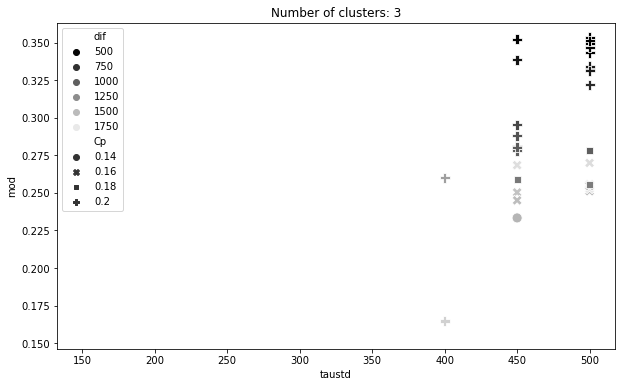

In [546]:
n_clust = 3

dat = grid[(grid.n_clust == n_clust) & (grid['mod'] > 0.06)]

fig, ax = plt.subplots(1,1, figsize=(10, 6))
_ = sns.scatterplot(data=dat,
                    x='taustd', y='mod', 
                    hue='dif',
                    style='Cp',
                    palette='gray',
                    s=100,
                    ax=ax)
ax.set_title(f'Number of clusters: {n_clust}')
ax.legend(loc='upper left')

386


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cell_id: 4151 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Cell_id: 4152 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cell_id: 4103 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cell_id: 4274 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cell_id: 4122 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cell_id: 4142 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cell_id: 4123 not found.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


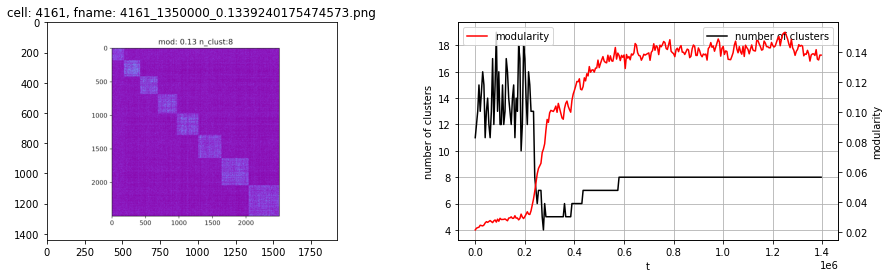

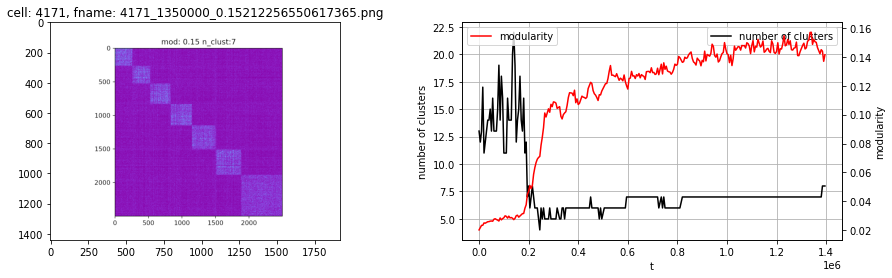

<Figure size 1080x288 with 0 Axes>

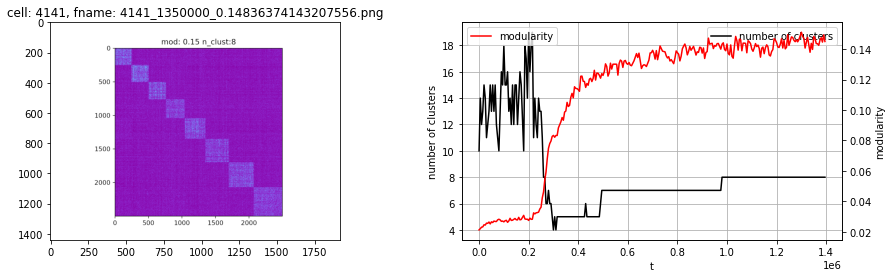

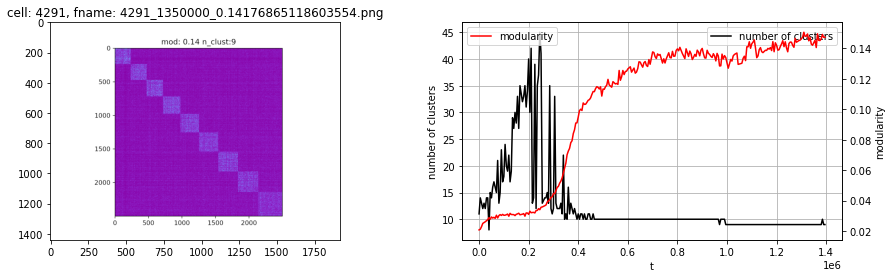

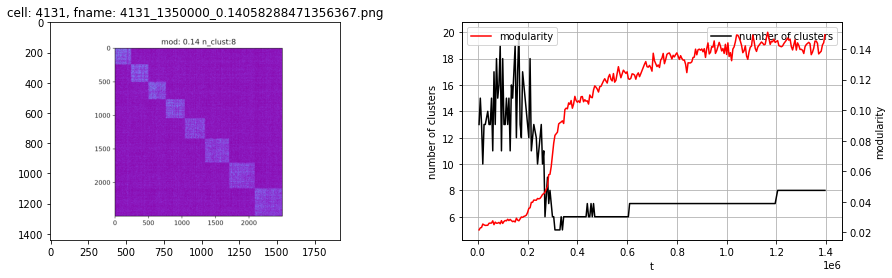

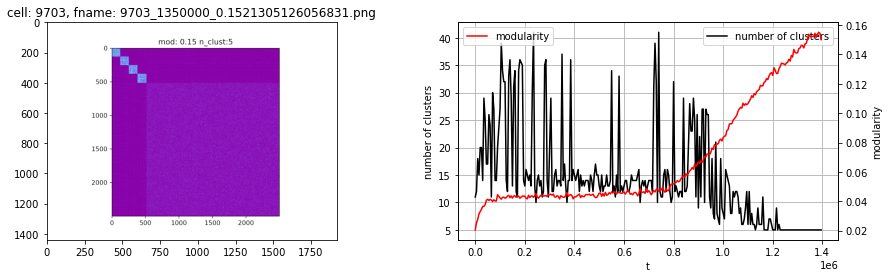

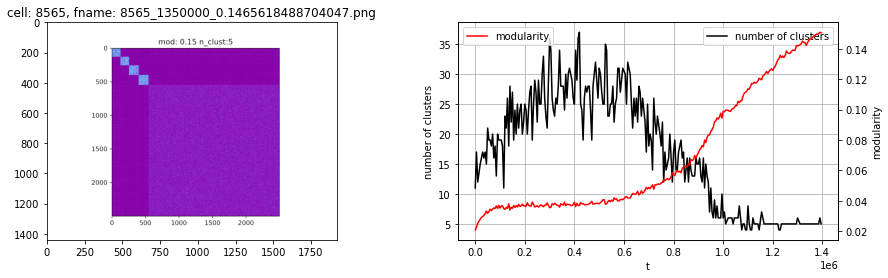

...

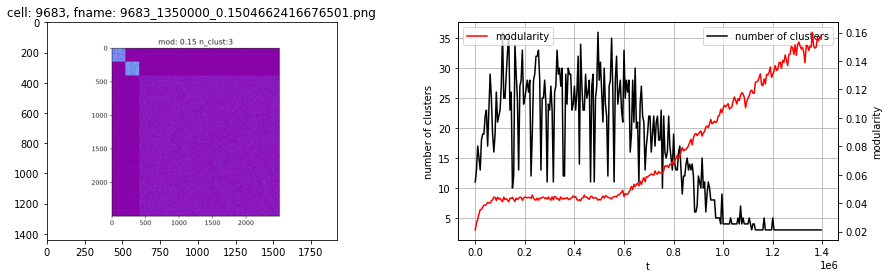

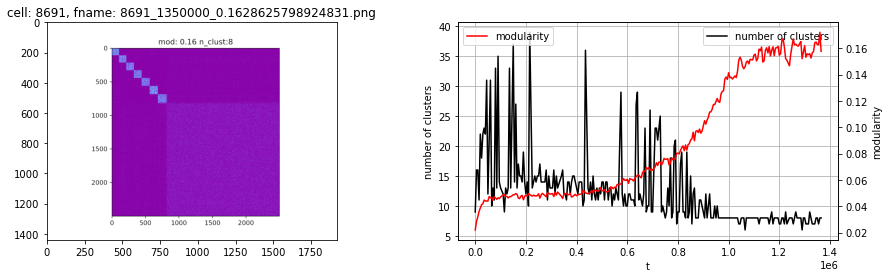

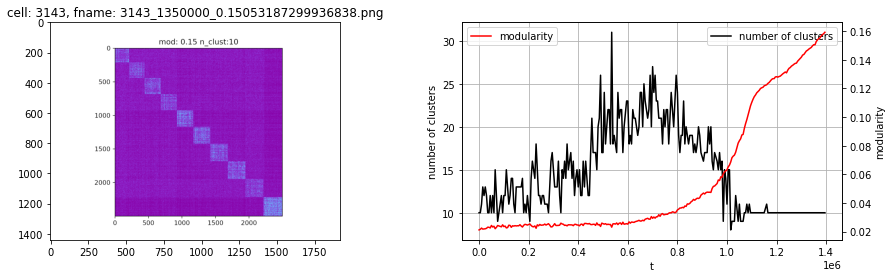

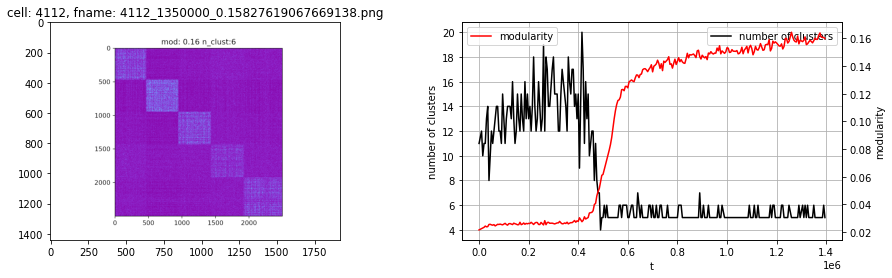

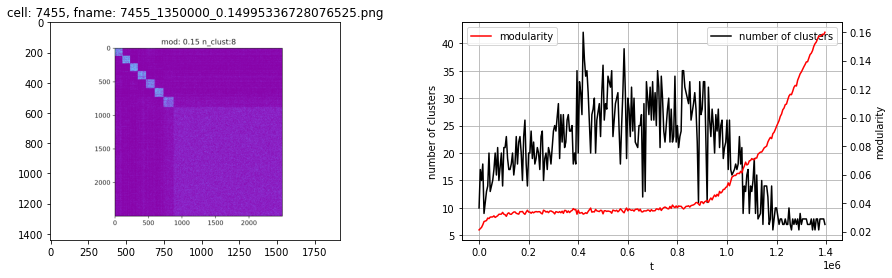

<Figure size 1080x288 with 0 Axes>

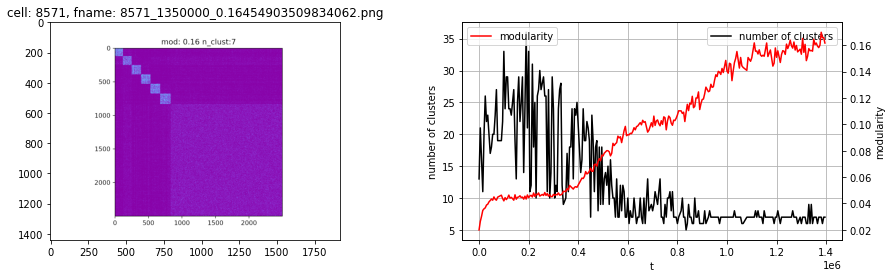

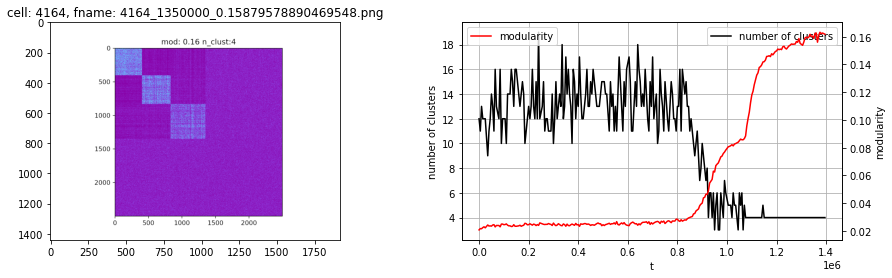

<Figure size 1080x288 with 0 Axes>

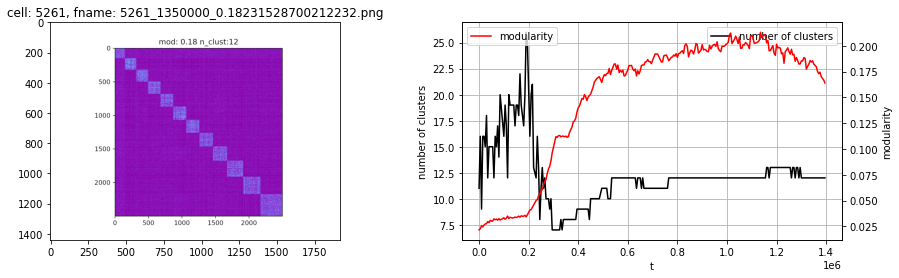

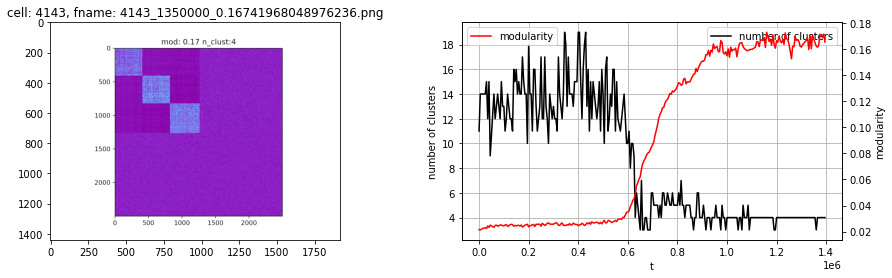

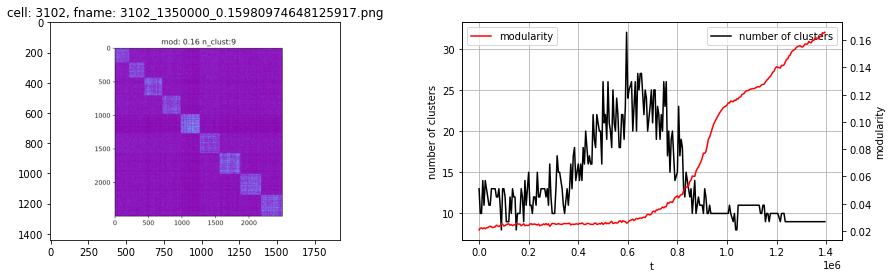

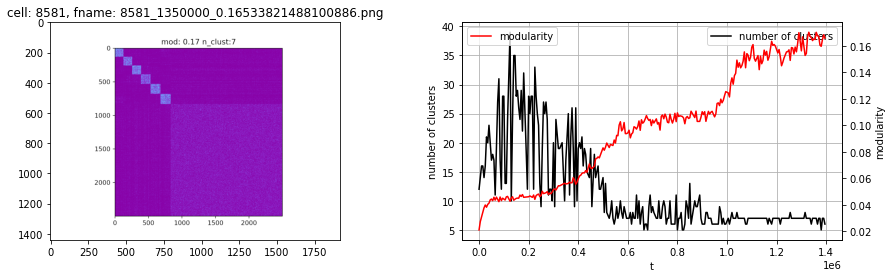

<Figure size 1080x288 with 0 Axes>

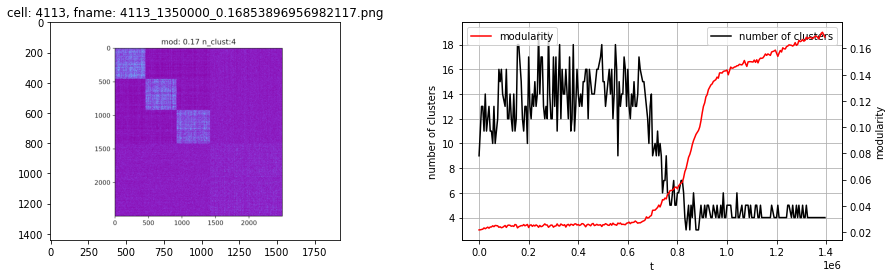

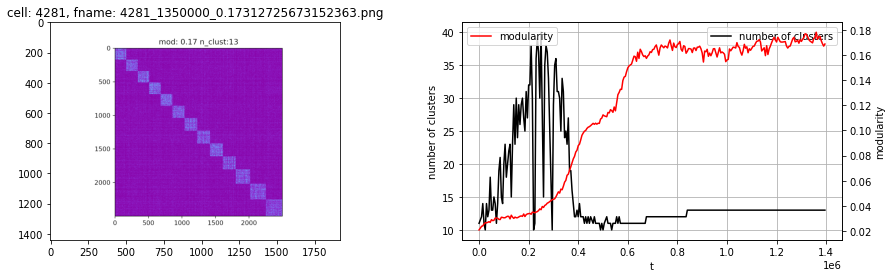

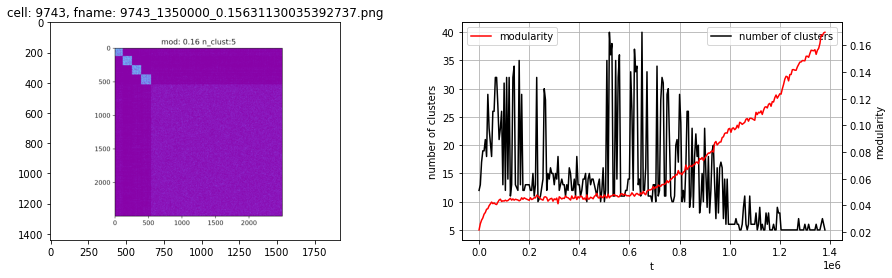

<Figure size 1080x288 with 0 Axes>

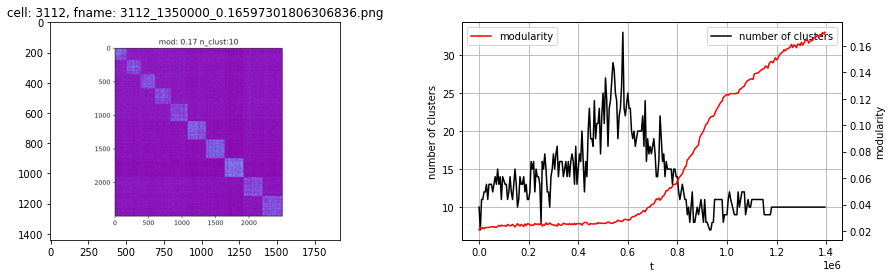

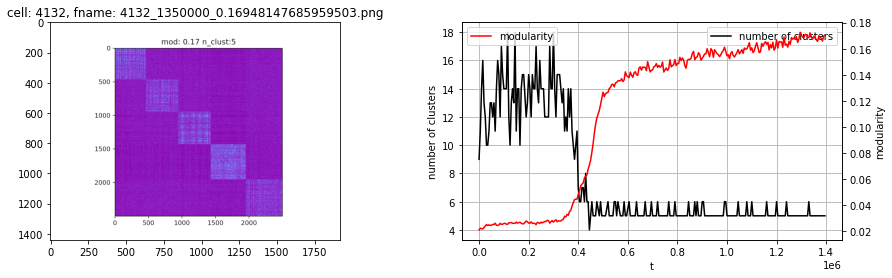

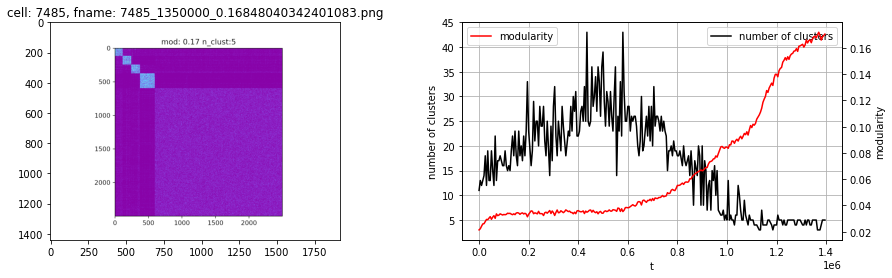

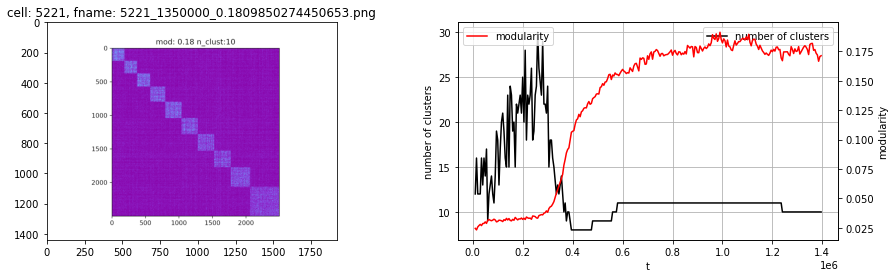

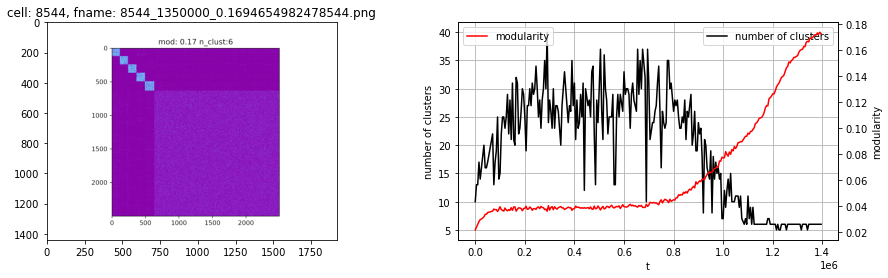

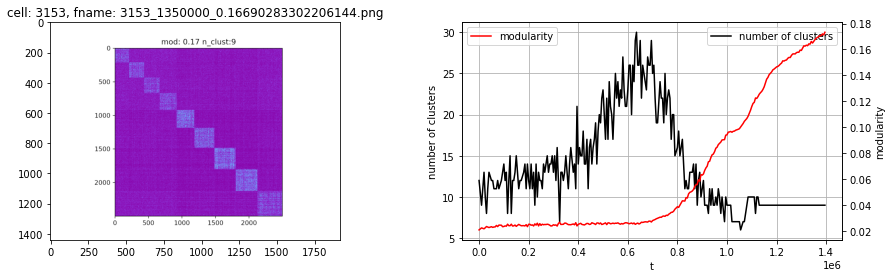

<Figure size 1080x288 with 0 Axes>

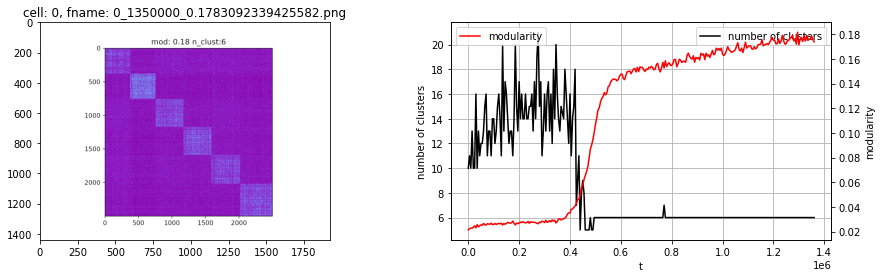

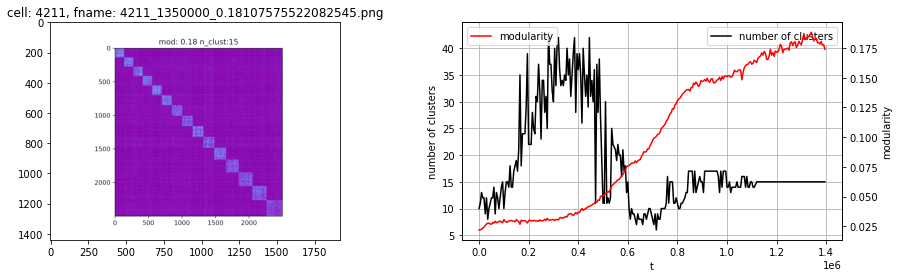

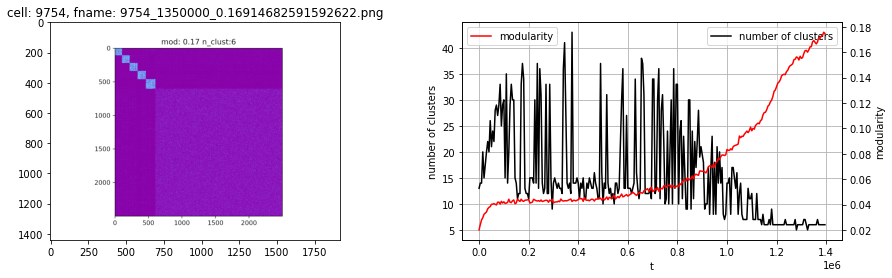

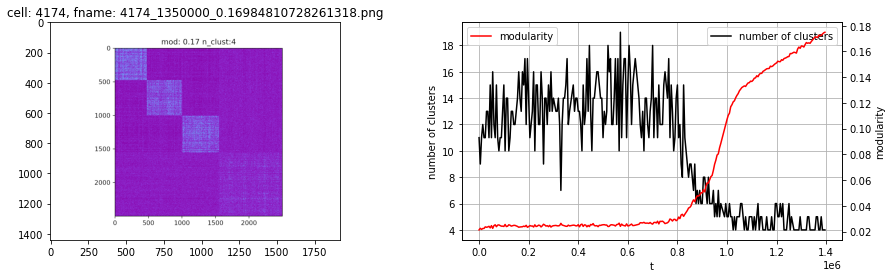

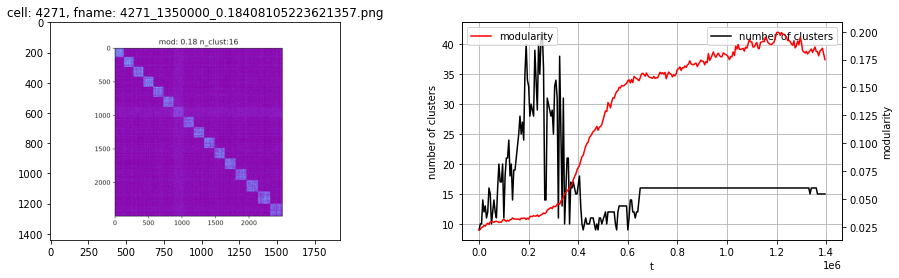

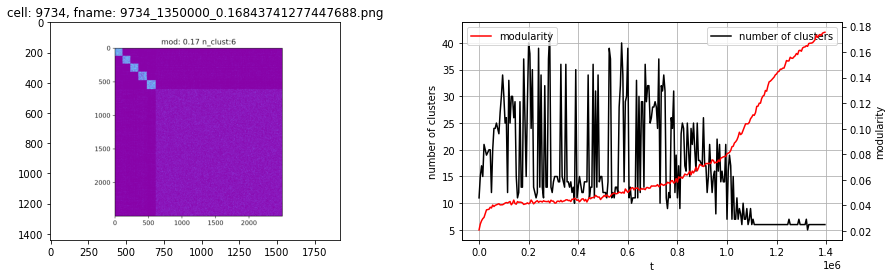

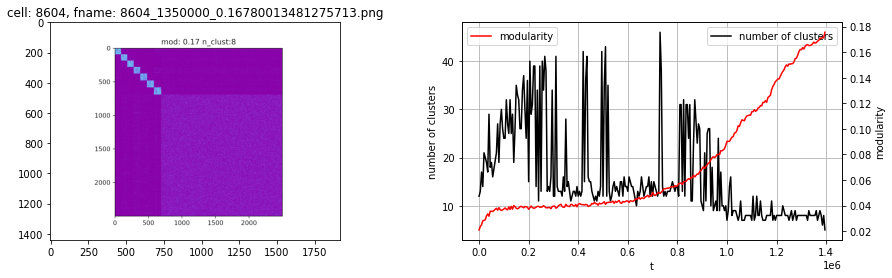

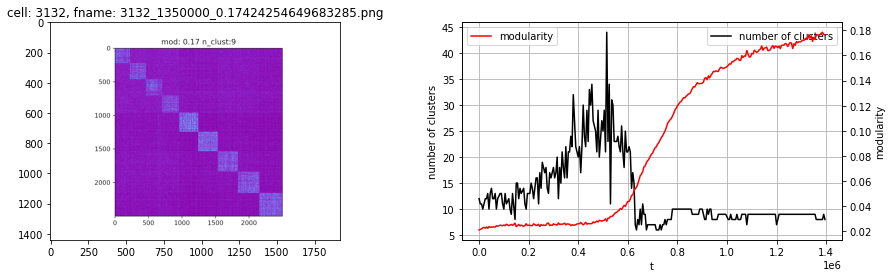

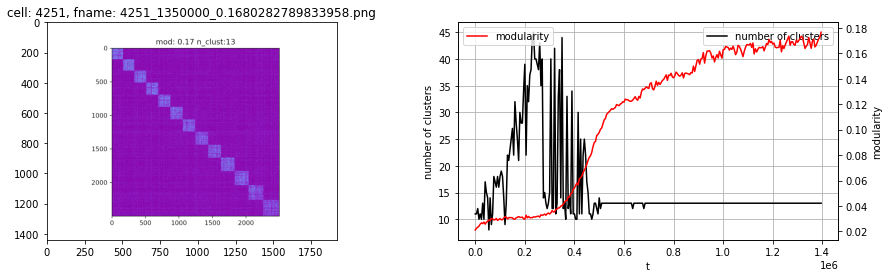

<Figure size 1080x288 with 0 Axes>

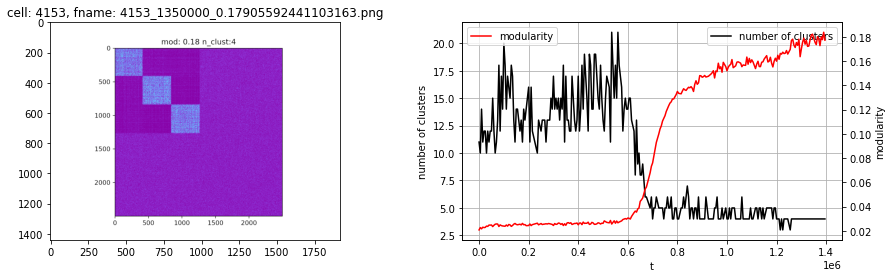

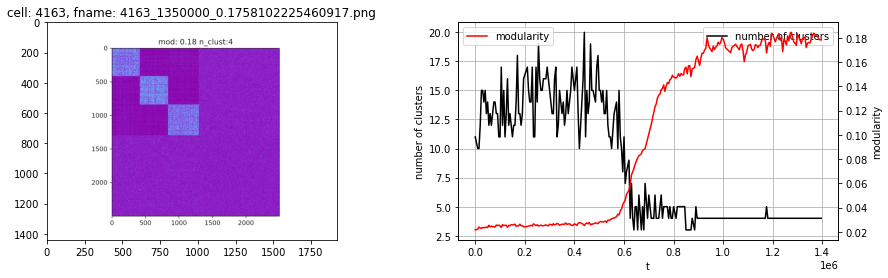

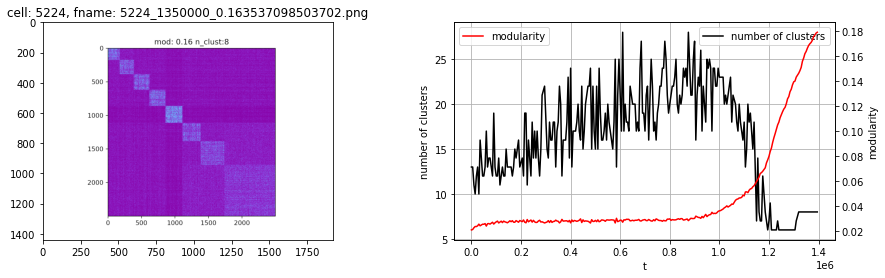

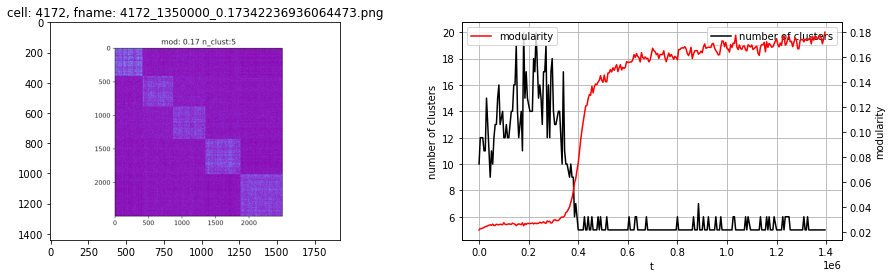

In [579]:
# we take cells with high modularity, without too small clusters and plot thier timecourse
cellids = grid[(grid['mod']>0.09) & (grid['min_clust'] > 100) & (grid['n_clust'] > 2)].sort_values(by='mod').rename_axis('old_id').reset_index().cell_id

print(len(cellids))
fnames = [i for i in os.listdir(
    '/home/roman/bucket/slurm/'
) if (i.endswith(f'.png') and int(i.split("_")[1]) == 1350000)]


for cell_id in cellids[:50]:
    plt.figure(figsize=(15,4))
    try: 
        fname = [j for j in fnames if int(j.split('_')[0]) == cell_id][0]
        img = mpimg.imread(f'/home/roman/bucket/slurm/{fname}')
        plt.subplot(1,2,1)
        plt.imshow(img*2, vmax=0.1)  
        plt.title(f'cell: {cell_id}, fname: {fname}')

        plt.subplot(1,2,2)
        ax = plt.gca()
        ax_ = ax.twinx()
        df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='n_clust', label=cell_id, legend=None, ax=ax, color='black')
        df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='mod', label=cell_id, ax=ax_, color='red')
        ax.legend(["number of clusters"])
        ax.set_ylabel("number of clusters")
        ax_.legend(["modularity"])
        ax_.set_ylabel("modularity")
        ax.grid()
    except:
        print(f'Cell_id: {cell_id} not found.')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


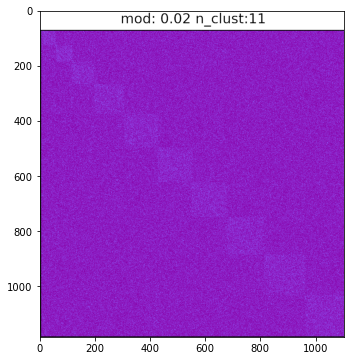

In [556]:
# get clipped weights image
fname = '5_5000_0.021083640139726204.png'
img = mpimg.imread(f'/home/roman/bucket/slurm/{fname}')
plt.figure(figsize=(6,6))
plt.imshow(img[100:1283, 428:1530]*2, vmin=0.1, vmax=0.2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


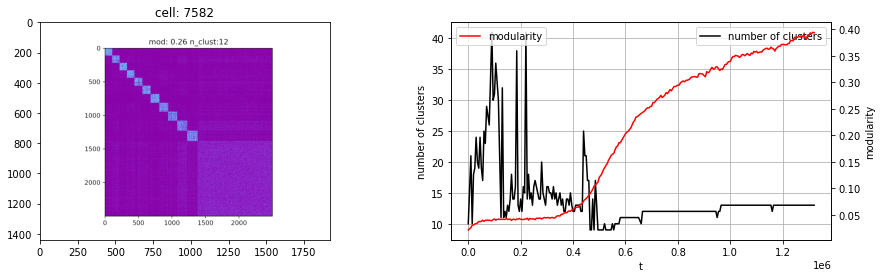

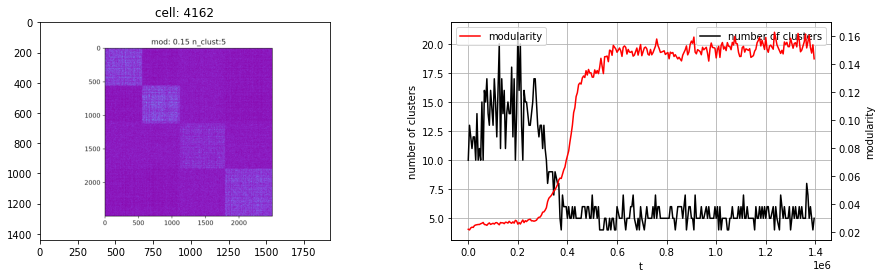

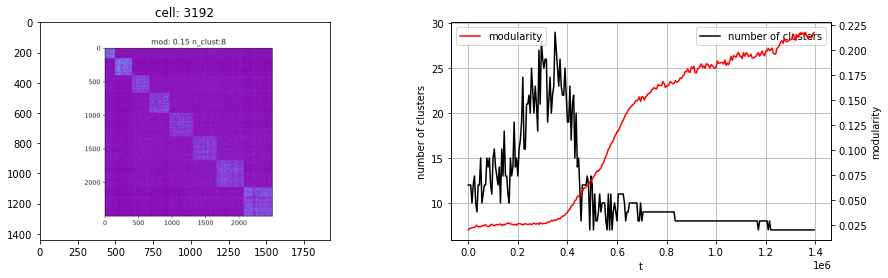

In [558]:
# prefix = '/bucket/roman/deigo/H2/GRID/slurm/'
prefix = '/home/roman/bucket/slurm/'

cell_id = 7582

plt.figure(figsize=(15,4))
fname = [j for j in fnames if int(j.split('_')[0]) == cell_id][0]
img = mpimg.imread(f'{prefix}{fname}')
plt.subplot(1,2,1)
plt.imshow(img*2, vmax=0.1)  
plt.title(f'cell: {cell_id}')

plt.subplot(1,2,2)
ax = plt.gca()
ax_ = ax.twinx()
df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='n_clust', label=cell_id, legend=None, ax=ax, color='black')
df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='mod', label=cell_id, ax=ax_, color='red')
ax.legend(["number of clusters"])
ax.set_ylabel("number of clusters")
ax_.legend(["modularity"])
ax_.set_ylabel("modularity")
ax.grid()


cell_id = 4162

plt.figure(figsize=(15,4))
fname = [j for j in fnames if int(j.split('_')[0]) == cell_id][0]
img = mpimg.imread(f'{prefix}{fname}')
plt.subplot(1,2,1)
plt.imshow(img*2, vmax=0.1)  
plt.title(f'cell: {cell_id}')

plt.subplot(1,2,2)
ax = plt.gca()
ax_ = ax.twinx()
df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='n_clust', label=cell_id, legend=None, ax=ax, color='black')
df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='mod', label=cell_id, ax=ax_, color='red')
ax.legend(["number of clusters"])
ax.set_ylabel("number of clusters")
ax_.legend(["modularity"])
ax_.set_ylabel("modularity")
ax.grid()

cell_id = 3192

plt.figure(figsize=(15,4))
fname = [j for j in fnames if int(j.split('_')[0]) == cell_id][0]
img = mpimg.imread(f'{prefix}{fname}')
plt.subplot(1,2,1)
plt.imshow(img*2, vmax=0.1)  
plt.title(f'cell: {cell_id}')

plt.subplot(1,2,2)
ax = plt.gca()
ax_ = ax.twinx()
df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='n_clust', label=cell_id, legend=None, ax=ax, color='black')
df[df.cell_id == cell_id].sort_values(by='t').plot(x='t', y='mod', label=cell_id, ax=ax_, color='red')
ax.legend(["number of clusters"])
ax.set_ylabel("number of clusters")
ax_.legend(["modularity"])
ax_.set_ylabel("modularity")
ax.grid()


<AxesSubplot:xlabel='taustd', ylabel='mod'>

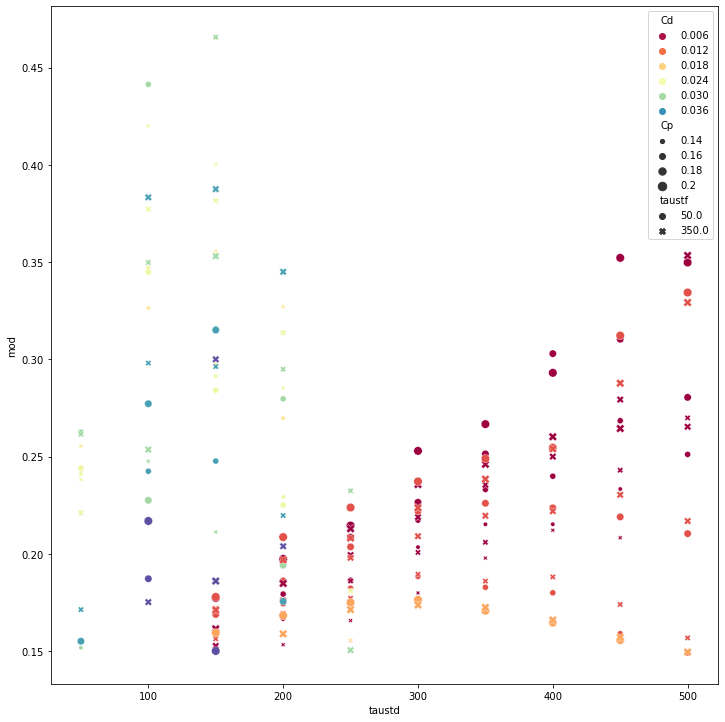

In [559]:
fig, ax = plt.subplots(1,1, figsize=(10, 10))
plt.tight_layout()
sns.scatterplot(data=grid[(grid.Cp >= 0.14) & ((grid.taustf == 50) | (grid.taustf == 350))],
                x='taustd', y='mod', hue='Cd', size='Cp', style='taustf',
                ax=ax, palette = "Spectral")

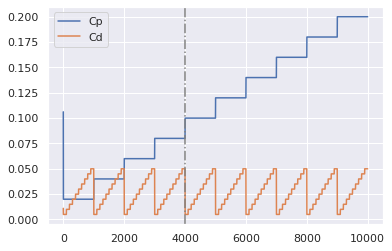

In [81]:
tmp = pd.read_pickle('df.pkl')
tmp.plot(y=['Cp', 'Cd'])
plt.gca().axvline(4000, ls='-.', c='grey')


In [90]:
tmp = grid[(grid['mod'] > 0.17) & (grid['n_clust'] > 3)].rename_axis('old_id').reset_index()
tmp.sort_values(by='n_clust')

,old_id,U,Cp,Cd,tpp,tpd,taustf,taustd,max_t,mod,n_clust,min_clust,max_clust
2,6391,0.8,0.14,0.02,15.1549,120.4221,500.0,50.0,485000.0,0.181492,9.0,119.0,1196.0
4,6352,0.8,0.14,0.02,15.1549,120.4221,300.0,100.0,550000.0,0.171416,9.0,119.0,1133.0
1,6381,0.8,0.14,0.02,15.1549,120.4221,450.0,50.0,520000.0,0.170354,10.0,109.0,1355.0
3,6371,0.8,0.14,0.02,15.1549,120.4221,400.0,50.0,490000.0,0.170763,10.0,134.0,772.0
5,6361,0.8,0.14,0.02,15.1549,120.4221,350.0,50.0,510000.0,0.172551,10.0,99.0,1272.0
6,6392,0.8,0.14,0.02,15.1549,120.4221,500.0,100.0,485000.0,0.202873,10.0,132.0,651.0
7,6372,0.8,0.14,0.02,15.1549,120.4221,400.0,100.0,485000.0,0.178682,10.0,118.0,626.0
0,6351,0.8,0.14,0.02,15.1549,120.4221,300.0,50.0,550000.0,0.202392,11.0,120.0,1089.0


In [57]:
[i for i in os.listdir('/home/roman/Downloads/delete') if i.startswith('wts_7069')]

['wts_7069.pkl']

,old_id,U,Cp,Cd,tpp,tpd,taustf,taustd,max_t,mod,n_clust,min_clust,max_clust


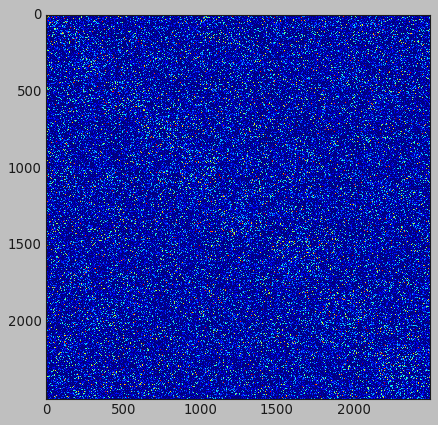

In [259]:
import matplotlib.pyplot as plt
import pickle

idx = 7364


fname = 'wts_7364_420000.pkl'

with open(f'/home/roman/Downloads/delete/{fname}', 'rb') as f:
    w = pickle.load(f)
plt.style.use('classic')
plt.figure()
plt.imshow(w, vmin=0, vmax=0.4)

tmp[tmp.index == idx]

In [81]:
tmp[tmp.old_id == idx]

,old_id,U,Cp,Cd,tpp,tpd,taustf,taustd,max_t,mod,n_clust,min_clust,max_clust
21,7069,0.8,0.16,0.005,15.1549,120.4221,350.0,450.0,455000.0,0.242577,2.0,690.0,1810.0


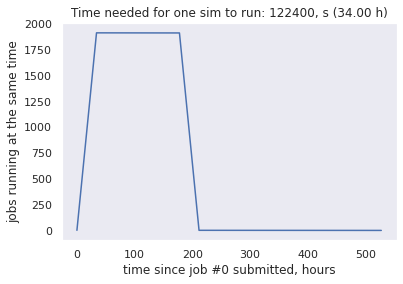

In [5]:
# precompile the share c++ module with O3, not Ofast if you run your grid on compute (on short use Ofast)
# set #SBATCH --time=0-6:45:0
# T_ms, saving time t in [5000, 400000, 700000, 1350000], and if mod > 0.035:
# sleep 13 (grid_search.sh)


cells_in_grid = 10000  # how many cells are in your grid
model_time_s = 3600*2     # how many seconds of model time we want to run
actual_time_to_run_one_second = 17      # estimated time to simulate on second, s
time_needed_for_one_simulation_s = model_time_s * actual_time_to_run_one_second
delay_between_jobs_s = 64  # how many seconds to wait before submitting the next job
max_time_s = 1900000       # size of matrix (take enough, to fit the curve)
j = 0
x = np.zeros((cells_in_grid, max_time_s))
for i in range(cells_in_grid):
    x[i, j:j + time_needed_for_one_simulation_s] = 1
    j += delay_between_jobs_s
plt.plot(np.linspace(0, max_time_s/3600, max_time_s), x.sum(axis=0))
plt.ylabel('jobs running at the same time')
plt.xlabel('time since job #0 submitted, hours')
plt.title(f'Time needed for one sim to run: {time_needed_for_one_simulation_s}, s ({(time_needed_for_one_simulation_s/3600):.2f} h)')
plt.grid()

In [6]:
210/24

8.75

In [492]:
! scp readme.md roman-koshkin@deigo.oist.jp:/bucket/FukaiU/Roman/slurm/

readme.md                                     100%  128   142.2KB/s   00:00    


In [254]:
# see what's in the queue on deigo
! ssh deigo 'squeue'

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON) 
      10414668_[1]   compute JOBNAME1 roman-ko PD       0:00      1 (None) 
      10414669_[1]   compute JOBNAME1 roman-ko PD       0:00      1 (None) 
      10414671_[1]   compute JOBNAME1 roman-ko PD       0:00      1 (None) 
        10414168_1   compute JOBNAME1 roman-ko  R      34:05      1 deigo010922 
        10414169_1   compute JOBNAME1 roman-ko  R      34:05      1 deigo011203 
        10414170_1   compute JOBNAME1 roman-ko  R      34:05      1 deigo010901 
        10414166_1   compute JOBNAME1 roman-ko  R      34:39      1 deigo011222 
        10414162_1   compute JOBNAME1 roman-ko  R      34:43      1 deigo010906 
        10414163_1   compute JOBNAME1 roman-ko  R      34:43      1 deigo010922 
        10414164_1   compute JOBNAME1 roman-ko  R      34:43      1 deigo011222 
        10414156_1   compute JOBNAME1 roman-ko  R      35:10      1 deigo011203 
        10414157_1   compute JOBNAME1 

In [251]:
fnames = [i for i in os.listdir('/home/roman/Downloads/delete') if i.startswith(f'wts_')]

for fname in fnames:
    with open(f'/home/roman/Downloads/delete/{fname}', 'rb') as f:
        w = pickle.load(f)
        try:
            n = fname.split('_')[1]
            mod = df.iloc[int(n)]['mod']
            n_clust = df.iloc[int(n)]['n_clust']
            print(n)
        except:
            n = fname.split('_')[1].split('.')[0]
            mod = df.iloc[int(n)]['mod']
            n_clust = df.iloc[int(n)]['n_clust']
            print(n)
        _ = plt.imshow(w, vmin=0.1, vmax=0.6)
        _ = plt.colorbar()
        plt.title(f'mod: {mod:.2f} n_clust:{n_clust}')
        _ = plt.savefig(f'/home/roman/Downloads/delete/{fname}.png')
        
        _ = plt.clf()

7351
7943
7129
7304
7080
7371
7139
7072
7116
7064
7004
7413
7062
7362
7075
7356
7017
7225
7070
7025
7613
7088
7403
7451
7059
7453
7018
7085
7443
7301
7332
7096
7236
7033
7226
7372
7314
7066
7050
7238
7612
7228
7139
7057
7448
7118
7114
7003
7077
7121
7919
7126
7237
7060
7412
7047
7037
7112
7086
7102
7364
7608
7590
7117
7107
7315
7357
7052
7008
7452
7302
7016
7445
7130
7946
7015
7234
7128
7120
7138
7303
7108
7005
7611
7137
7446
7103
7069
7922
7353
7114
7393
7020
7607
7212
7101
7053
7593
7056
7414
7030
7029
7312
7055
7109
7592
7019
7040
7039
7104
7383
7406
7898
7344
7313
7078
7027
7010
7124
7023
7013
7300
7664
7401
7311
7224
7395
7233
7063
7415
7092
7099
7076
7897
7032
7036
7026
7416
7068
7034
7097
7049
7594
7664
7087
7079
7363
7116
7105
7125
7065
7136
7067
7038
7094
7899
7045
7454
7945
7117
7595
7352
7106
7227
7384
7403
7110
7119
7028
7140
7006
7235
7402
7447
7002
7407
7614
7947
7115
7007
7024
7048
7299
7417
7113
7897
7054
7022
6998
7944
7009
7089
7223
7354
7046
7355
7090
7115
7222
7058


<Figure size 432x288 with 0 Axes>

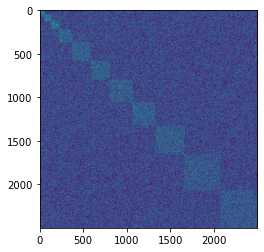

In [10]:
plt.imshow(w, vmin=0.01, vmax=0.1)

In [26]:
T_ms = 710000
stride_ms = 5000

TIMES = np.arange(0, T_ms, stride_ms)
for i in range(len(TIMES)):
    t = TIMES[i]
    if t in [400000, 700000]:
        print(t)

400000
700000
